# Data

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shap

import lime
import lime.lime_tabular

In [2]:
from model_function import Load_Model
import warnings
warnings.filterwarnings("ignore")

features = Load_Model("features")
X_train = np.array(Load_Model("X_train"))
X_train_df = pd.DataFrame(X_train, columns = features)
y_train = Load_Model("y_train")
xgb_model = Load_Model("xgb_model")
X_test = np.array(Load_Model("X_test"))
X_test_df = pd.DataFrame(X_test, columns = features)
y_test = Load_Model("y_test")

df = Load_Model("df")
df


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years,percent_houses_damaged
0,-0.704686,1.420347,-0.272376,-1.175524,-1.265043,-0.100972,0.691289,0.852915,1.094009,1.008363,-0.617499,-0.352036,0.935205,-0.731012,-1.510670,1.947325,-0.279989,-0.241398,0.0
1,-0.788156,1.673016,-0.270376,-1.133698,-1.255425,1.106914,0.878330,0.504172,0.893696,0.244915,-0.523135,2.853693,0.935205,-0.731012,-1.131296,1.565883,-0.278028,-0.241398,0.0
2,-0.654702,1.277761,-0.272098,-1.168104,-1.229554,-1.320165,1.784406,2.153799,2.099183,2.653361,-0.429186,3.181211,0.935205,-0.731012,-1.212591,1.647621,-0.276812,-0.241398,0.0
3,-0.700491,1.404514,-0.269193,-1.192053,-1.257415,-0.142657,0.468673,0.648387,0.594333,0.773553,-0.564862,2.440864,0.935205,-0.731012,-1.185493,1.620375,-0.265103,-0.241398,0.0
4,-0.743750,1.531266,-0.237499,-1.188679,-1.272174,-0.350679,0.845817,0.509406,0.791717,0.286700,-0.400399,4.370635,0.935205,-0.405585,-0.264156,0.503295,-0.197596,-0.241398,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49749,-1.064795,1.196675,-0.270872,-0.918833,-1.028225,-1.625712,0.232948,1.047870,0.320292,1.146974,-0.627544,-0.546194,0.935205,-0.684523,-1.510670,1.920079,-0.277650,0.534283,0.0
49750,-1.096719,1.324220,-0.213470,-0.932662,-1.067363,0.234747,-0.731858,-0.467369,-0.742849,-0.426405,-0.671409,1.987683,0.935205,-0.498564,-0.995806,1.293424,-0.241674,0.534283,0.0
49751,-1.132933,1.451765,-0.249755,-0.973477,-1.099370,1.060794,-0.733432,-0.545714,-0.691924,-0.451157,-0.694968,0.191214,0.935205,-0.684523,-1.456474,1.865587,-0.241895,0.534283,0.0
49752,-1.160069,1.579301,-0.271725,-0.677320,-0.994939,-0.409290,-0.717276,-0.989344,-0.597840,-0.822308,-0.701709,-0.347840,0.935205,-0.731012,-1.436766,1.873018,-0.273510,0.534283,0.0


In [3]:
#from models import TwoStageXGB
from model_function import TwoStageXGB

xgb2sg = TwoStageXGB()
xgb2sg.fit(X_train, y_train)
y_predxgb2 = xgb2sg.predict(X_test)
y_predxgb2

array([0.        , 0.7722644 , 0.12173709, ..., 0.8388178 , 2.3109682 ,
       0.02267693], dtype=float32)

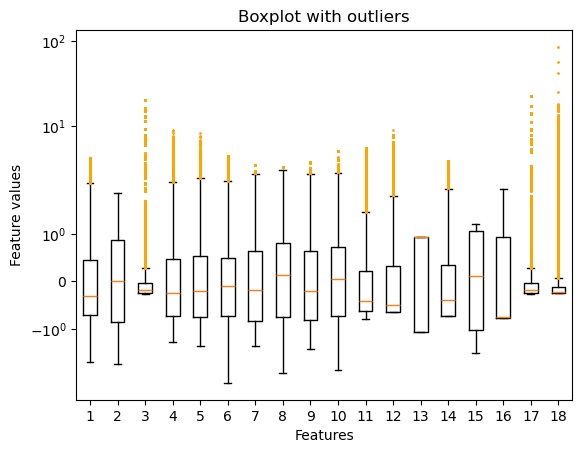

In [4]:
import matplotlib.pyplot as plt

data = X_train_df

flierprops = dict(marker='o', markerfacecolor='orange', markersize=1,
                  linestyle='none', markeredgecolor='orange')

plt.boxplot(data, flierprops=flierprops)
plt.yscale('symlog')
plt.title('Boxplot with outliers')
plt.ylabel('Feature values')
plt.xlabel('Features')
plt.show()

In [5]:
X_train_df.describe()

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
count,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000
mean,-0.002143,0.004335,0.003170,-0.002330,-0.001688,0.002201,0.000055,-0.000370,0.000104,-0.000062,0.000388,-0.005000,-0.004567,0.002194,0.003215,-0.004519,0.003117,0.001704
std,0.998481,1.000240,1.013502,1.000059,1.000276,1.005465,0.999066,0.999702,0.998929,0.999761,0.997014,0.992042,1.000308,1.003765,1.000748,0.999116,1.009798,1.038877
min,-1.707177,-1.736926,-0.272381,-1.283463,-1.364270,-2.398227,-1.363106,-1.923889,-1.420829,-1.879706,-0.799384,-0.657215,-1.069284,-0.731012,-1.510670,-0.777261,-0.279989,-0.241398
25%,-0.705676,-0.861693,-0.255327,-0.722856,-0.753986,-0.725406,-0.832678,-0.763209,-0.827007,-0.741712,-0.620320,-0.657215,-1.069284,-0.731012,-1.022904,-0.777261,-0.258742,-0.241398
50%,-0.306720,0.014025,-0.194709,-0.247926,-0.209809,-0.100972,-0.193467,0.120476,-0.201337,0.052261,-0.413047,-0.494643,0.935205,-0.405585,0.115218,-0.750015,-0.191281,-0.234200
75%,0.449401,0.873717,-0.042749,0.468855,0.533233,0.487379,0.630685,0.797319,0.627169,0.709363,0.208688,0.321714,0.935205,0.338248,1.051336,0.939228,-0.044021,-0.119900
max,4.263524,1.854785,20.364842,9.156238,8.471007,4.542875,3.509511,3.354381,3.831545,5.098294,5.617673,9.089242,0.935205,3.917947,1.199144,1.947325,22.495408,85.026465


# Global LIME
## Simple XGBoost

In [ ]:
# Global lime values

explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train, feature_names=features, verbose=True, mode='regression', discretize_continuous=False, random_state=0)

# iterate through all instances of test set and save explanations for each feature in list
lime_dict = {}

for i in range(len(X_test)):
    instance = X_test[i]
    explanation = explainer.explain_instance(instance, xgb_model.predict, num_features=len(features))
    explist = dict(explanation.as_list())
    for feature in explist.keys():
        if feature not in lime_dict:
            lime_dict[feature] = []
        lime_dict[feature].append(explist[feature])

print(lime_dict)

In [52]:
lime_df = pd.DataFrame(lime_dict)
lime_df.head()

,wind_speed,track_distance,rwi,rainfall_max_6h,percent_houses_damaged_5years,total_pop,total_houses,urban,coast_length,with_coast,rainfall_max_24h,water,mean_slope,rural,mean_elev,std_tri,mean_tri,std_slope
0,0.471535,-0.234203,-0.174555,0.077016,0.056331,-0.037185,-0.033742,-0.033669,0.026497,0.020261,0.019920,0.018563,0.017908,0.017089,0.017012,-0.014846,-0.011321,0.007259
1,0.787490,-0.257148,-0.226259,0.085066,0.053028,-0.068474,-0.062479,-0.028915,0.059550,0.005954,0.077994,-0.002147,-0.017582,-0.009817,-0.017161,-0.031392,0.034065,0.029236
2,0.479695,-0.344571,-0.254403,0.124536,0.070052,-0.031545,-0.002880,-0.054920,0.021797,0.015566,0.041380,-0.002328,0.002508,0.035846,0.035624,-0.051974,-0.000929,-0.014946
3,0.469704,-0.245367,-0.156912,0.072544,0.062915,-0.057935,-0.028118,0.001152,0.038531,-0.030696,0.043152,0.008229,-0.006681,0.030961,0.026465,-0.037493,0.005942,-0.004481
4,0.529980,-0.300133,-0.184408,0.091013,0.071324,-0.062871,-0.026858,-0.030280,0.016179,0.029968,0.040526,-0.022235,-0.036447,0.041615,0.012506,-0.027317,-0.018994,-0.000925


In [71]:
lime_avg = lime_df.abs().mean()
lime_sd = lime_df.abs().std()

limedf = pd.DataFrame(lime_avg, columns=["Value"]).sort_values(by="Value", ascending=False)
limedf["sd"] = pd.DataFrame(lime_sd, columns=["Value"])

limedf

,Value,sd
wind_speed,0.546223,0.128488
track_distance,0.274842,0.055303
rwi,0.178743,0.053752
rainfall_max_6h,0.087746,0.027495
percent_houses_damaged_5years,0.082354,0.025306
rainfall_max_24h,0.063410,0.024230
total_pop,0.041154,0.021612
coast_length,0.037576,0.022855
urban,0.035680,0.020844
rural,0.026221,0.018417


<BarContainer object of 18 artists>

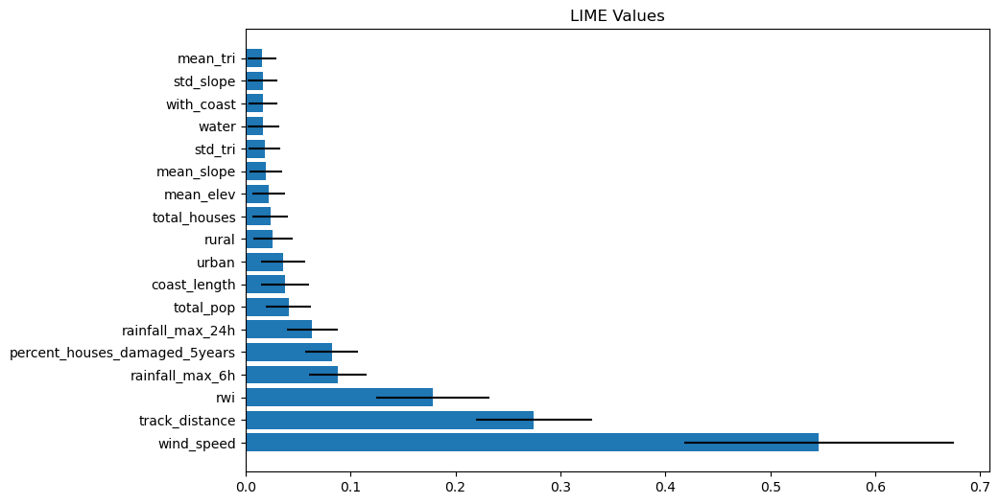

In [72]:
# plot lime values
plt.figure(figsize=(10, 6))
plt.title("LIME Values")
plt.barh(limedf.index, limedf["Value"], xerr=limedf["sd"])

In [74]:
lime_list = limedf.index.tolist()
lime_list

['wind_speed',
 'track_distance',
 'rwi',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'total_pop',
 'coast_length',
 'urban',
 'rural',
 'total_houses',
 'mean_elev',
 'mean_slope',
 'std_tri',
 'water',
 'with_coast',
 'std_slope',
 'mean_tri']

## Two-Stage Model

In [19]:
# Global lime values

explainer_lime = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=features, verbose=True, mode='regression', discretize_continuous=False, random_state=0)

# iterate through all instances of test set and save explanations for each feature in list
lime_dict2 = {}
X_test = np.array(X_test)

for i in range(len(X_test)):
    instance = X_test[i]
    explanation = explainer_lime.explain_instance(instance, xgb2sg.predict, num_features=len(features))
    explist = dict(explanation.as_list())
    for feature in explist.keys():
        if feature not in lime_dict2:
            lime_dict2[feature] = []
        lime_dict2[feature].append(explist[feature])

# print(lime_dict2)

Intercept 0.49884885960520864
Prediction_local [-0.03560168]
Right: 0.0
Intercept 0.5205739034454887
Prediction_local [2.4947172]
Right: 0.7722644
Intercept 0.48125962597752725
Prediction_local [0.61863634]
Right: 0.12173709
Intercept 0.4565114073900741
Prediction_local [0.3906884]
Right: 0.036116082
Intercept 0.46880173046685
Prediction_local [0.71044985]
Right: 0.092302345
Intercept 0.43137766922843634
Prediction_local [2.07849623]
Right: 0.41481566
Intercept 0.5003442311584896
Prediction_local [0.66954753]
Right: 0.7462493
Intercept 0.49923469218508926
Prediction_local [2.68801911]
Right: 1.7057182
Intercept 0.48489104214534606
Prediction_local [2.7971363]
Right: 2.8154812
Intercept 0.5019666875241084
Prediction_local [1.2375383]
Right: 0.09297933
Intercept 0.5125543063519982
Prediction_local [2.37597222]
Right: 1.3227004
Intercept 0.4960203712002676
Prediction_local [0.14011214]
Right: 0.016751148
Intercept 0.46328829477118233
Prediction_local [0.37339304]
Right: 0.01746045
Interce

{'wind_speed': 0.6423685735605352,
 'track_distance': 0.27582173895472173,
 'rwi': 0.18052061966359342,
 'rainfall_max_6h': 0.0908503811912343,
 'percent_houses_damaged_5years': 0.09029367241890768,
 'total_houses': 0.02778554278135992,
 'total_pop': 0.03064639542625903,
 'urban': 0.03716431455907215,
 'coast_length': 0.041941689924103104,
 'with_coast': 0.019942042395000987,
 'rainfall_max_24h': 0.07074311104495283,
 'mean_slope': 0.0270557020670651,
 'water': 0.02092623025390733,
 'std_tri': 0.021088800409033548,
 'rural': 0.0309100332082033,
 'mean_tri': 0.01956749668421806,
 'mean_elev': 0.021192531434483203,
 'std_slope': 0.02009775481154014}

In [75]:
lime_df2 = pd.DataFrame(lime_dict2, columns=features)

lime_avg2 = lime_df2.abs().mean()
lime_sd2 = lime_df2.abs().std()

limedf2 = pd.DataFrame(lime_avg2, columns=["Value"]).sort_values(by="Value", ascending=False)
limedf2["sd"] = pd.DataFrame(lime_sd2, columns=["Value"])

limedf2

,Value,sd
wind_speed,0.642369,0.160731
track_distance,0.275822,0.058220
rwi,0.180521,0.056756
rainfall_max_6h,0.090850,0.033467
percent_houses_damaged_5years,0.090294,0.031426
rainfall_max_24h,0.070743,0.030621
coast_length,0.041942,0.027407
urban,0.037164,0.024568
rural,0.030910,0.022418
total_pop,0.030646,0.021472


In [76]:
lime_list2 = limedf2.index.tolist()
lime_list2

['wind_speed',
 'track_distance',
 'rwi',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'coast_length',
 'urban',
 'rural',
 'total_pop',
 'total_houses',
 'mean_slope',
 'mean_elev',
 'std_tri',
 'water',
 'std_slope',
 'with_coast',
 'mean_tri']

<BarContainer object of 18 artists>

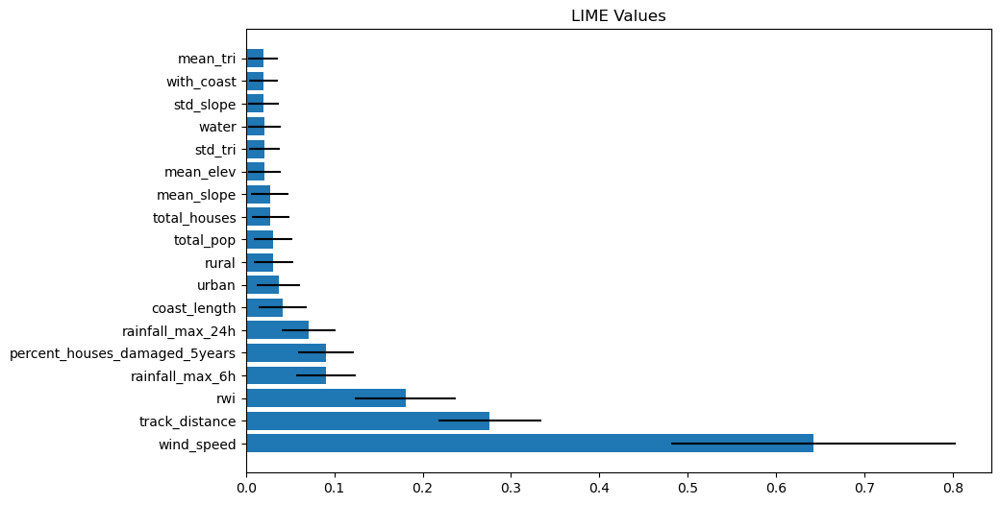

In [79]:
plt.figure(figsize=(10, 6))
plt.title("LIME Values")
plt.barh(limedf2.index, limedf2["Value"], xerr=limedf2["sd"])

# SHAP
## Simple XGBoost

In [2]:
import shap

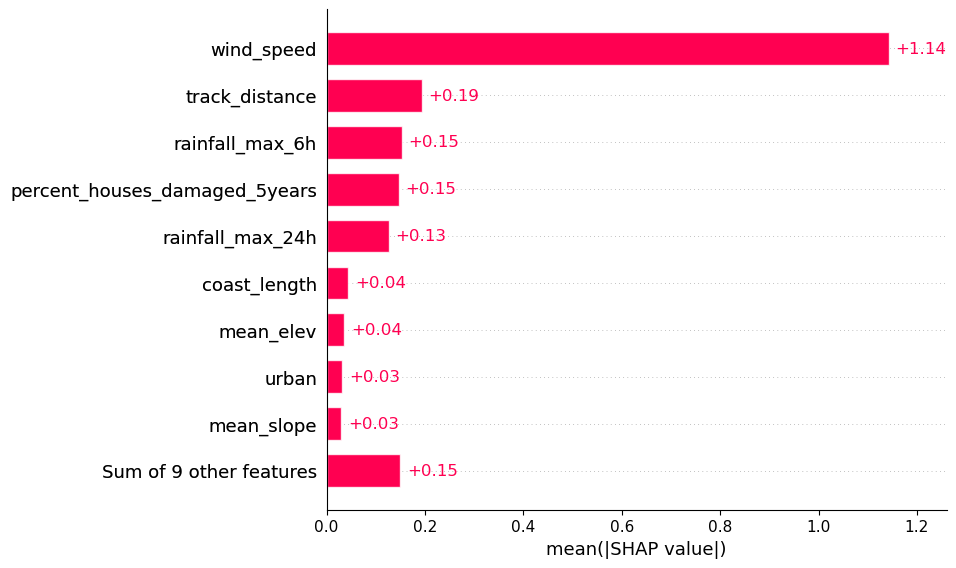

In [26]:
explainer = shap.TreeExplainer(xgb_model, X_train_df)
shap_values = explainer(X_test)
shap.plots.bar(shap_values)

In [28]:
shap_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)
shap_df

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
0,-0.727720,-0.142616,-0.014144,-0.117278,-0.086583,0.008816,-0.002138,0.006686,-0.002916,-0.007942,-0.024092,-0.031618,-0.003059,-0.001402,-0.004293,0.001082,0.002368,0.131702
1,0.602975,0.038964,0.026792,-0.112311,-0.236782,0.029664,-0.114777,-0.031608,0.000077,-0.037418,-0.122922,-0.086601,-0.003059,0.038619,0.030648,-0.034661,0.012790,-0.242245
2,-0.781257,-0.191329,-0.012823,-0.062602,-0.007049,0.017429,-0.004660,0.012504,-0.001682,0.022328,0.012908,-0.005268,0.000000,0.004354,-0.001196,0.001082,0.003668,0.101210
3,-0.673778,-0.078666,0.034904,-0.111562,-0.116531,0.008084,-0.003030,0.007475,-0.000398,-0.001953,0.003008,-0.003387,0.000000,0.017614,-0.003672,0.008635,0.005345,-0.070093
4,-0.622725,0.085588,-0.012030,-0.105409,-0.109363,0.010629,-0.002745,-0.007237,-0.000677,0.001296,-0.014167,-0.023299,-0.003059,-0.052160,-0.002947,0.002382,0.011962,-0.077857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9946,-0.683119,-0.165160,-0.015468,-0.057252,-0.045013,0.007385,-0.028058,-0.003370,-0.002916,0.000093,-0.029508,-0.027661,-0.003059,-0.000006,0.002376,0.001082,0.004656,0.100723
9947,-0.620731,-0.087759,-0.030049,-0.111845,-0.106549,0.010952,0.001756,-0.001022,0.000838,0.004863,-0.003962,-0.002393,0.000000,-0.021032,-0.002947,0.002212,0.002368,-0.087802
9948,-0.223606,0.357433,-0.011144,-0.129958,0.041105,0.001631,0.018064,-0.009202,0.000838,0.001296,0.015992,-0.003564,0.000000,-0.033096,-0.010055,0.022182,0.011090,-0.224309
9949,1.910674,-0.071866,-0.131349,-0.141815,-0.246065,0.019639,0.012574,0.012484,0.010893,0.011369,-0.025019,-0.020366,0.000000,-0.085514,-0.026675,0.001082,-0.081077,0.147878


In [29]:
shap_avg = shap_df.abs().mean()
shap_sd = shap_df.abs().std()

shapdf = pd.DataFrame(shap_avg, columns=["Value"]).sort_values(by="Value", ascending=False)
shapdf["sd"] = pd.DataFrame(shap_sd, columns=["Value"])
shapdf

,Value,sd
wind_speed,1.143016,3.218704
track_distance,0.193959,0.383100
rainfall_max_6h,0.153356,0.298492
percent_houses_damaged_5years,0.147206,0.240430
rainfall_max_24h,0.127089,0.292298
coast_length,0.044306,0.073809
mean_elev,0.036235,0.068355
urban,0.031970,0.074169
mean_slope,0.029997,0.078973
total_houses,0.028186,0.071151


(-0.1, 1.5)

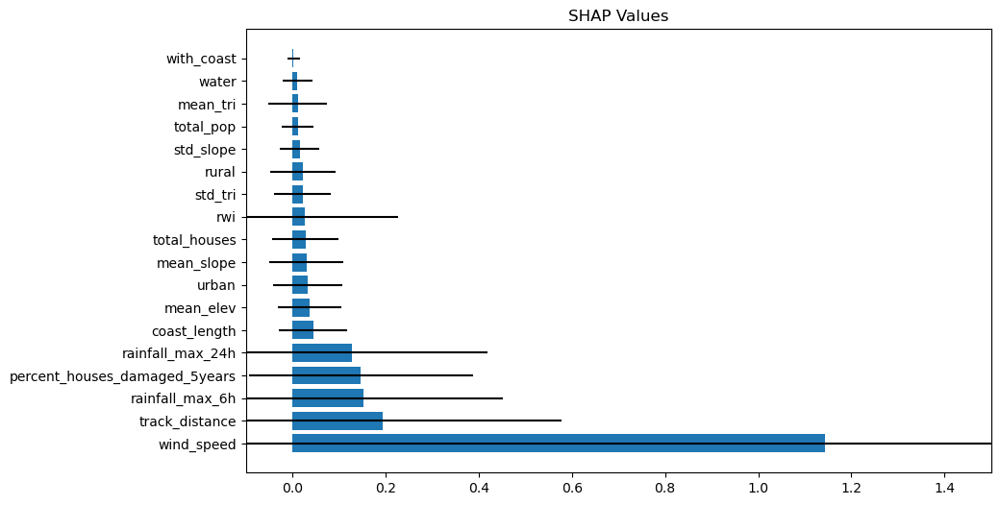

In [30]:
# plot shap values
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(shapdf.index, shapdf["Value"], xerr=shapdf["sd"])
plt.xlim(-0.1,1.5)

In [31]:
shap_list = shapdf.index.tolist()
shap_list

['wind_speed',
 'track_distance',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'coast_length',
 'mean_elev',
 'urban',
 'mean_slope',
 'total_houses',
 'rwi',
 'std_tri',
 'rural',
 'std_slope',
 'total_pop',
 'mean_tri',
 'water',
 'with_coast']

## Two-Stage Model

In [9]:
explainer2 = shap.Explainer(xgb2sg.predict, X_train_df, seed=0)
shap_values2 = explainer2(X_test)

PermutationExplainer explainer: 9952it [43:06,  3.84it/s]                            


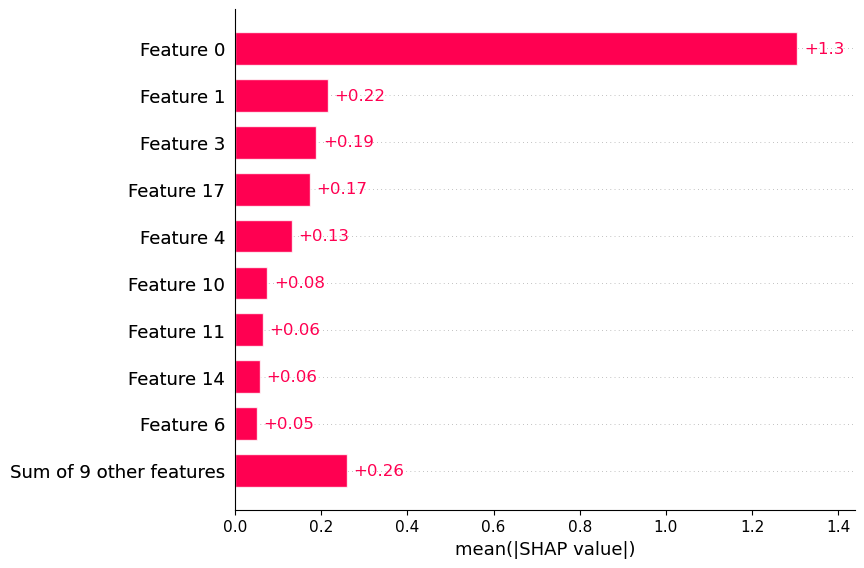

In [10]:
shap_df2 = pd.DataFrame(shap_values2.values, columns=features)
shap.plots.bar(shap_values2)	

In [11]:
shap_avg2 = shap_df2.abs().mean()
shap_sd2 = shap_df2.abs().std()

shapdf2 = pd.DataFrame(shap_avg2, columns=["Value"]).sort_values(by="Value", ascending=False)
shapdf2["sd"] = pd.DataFrame(shap_sd2, columns=["Value"])
shapdf2

,Value,sd
wind_speed,1.304403,3.474130
track_distance,0.215488,0.395762
rainfall_max_6h,0.189061,0.394301
percent_houses_damaged_5years,0.173283,0.302294
rainfall_max_24h,0.132199,0.364721
mean_elev,0.075072,0.176770
coast_length,0.064522,0.108509
rural,0.058482,0.160415
mean_slope,0.050334,0.135755
total_houses,0.043190,0.116632


(-0.1, 1.3)

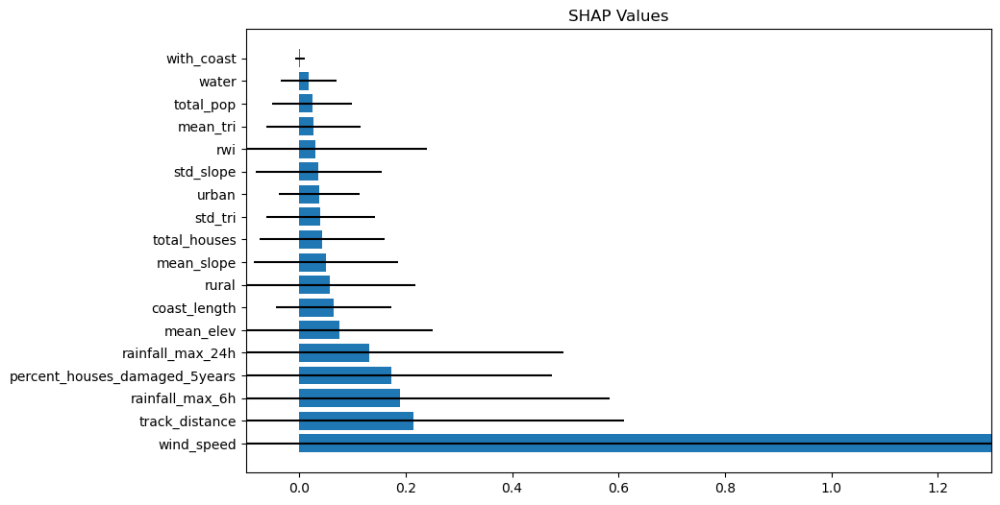

In [12]:
# plot shap values
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(shapdf2.index, shapdf2["Value"], xerr=shapdf2["sd"])
plt.xlim(-0.1,1.3)

In [13]:
shap_list_xgb2 = shapdf2.index.tolist()
shap_list_xgb2

['wind_speed',
 'track_distance',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'mean_elev',
 'coast_length',
 'rural',
 'mean_slope',
 'total_houses',
 'std_tri',
 'urban',
 'std_slope',
 'rwi',
 'mean_tri',
 'total_pop',
 'water',
 'with_coast']

# XGBoost Feature Importance

In [23]:
xgb_model.feature_importances_

array([0.3043809 , 0.06710534, 0.0224223 , 0.03948523, 0.06568365,
       0.03093547, 0.04649165, 0.03097617, 0.0479286 , 0.04627175,
       0.03612596, 0.02757391, 0.04302691, 0.01865382, 0.05211097,
       0.02849688, 0.02966141, 0.0626691 ], dtype=float32)

In [24]:
xgb_df = pd.DataFrame(xgb_model.feature_importances_, index=features, columns=["Importance"]).sort_values(by="Importance", ascending=False)
xgb_df

,Importance
wind_speed,0.304381
track_distance,0.067105
rainfall_max_24h,0.065684
percent_houses_damaged_5years,0.062669
rural,0.052111
mean_tri,0.047929
mean_slope,0.046492
std_tri,0.046272
with_coast,0.043027
rainfall_max_6h,0.039485


In [4]:
xgb_list = xgb_df.index.tolist()
xgb_list

['wind_speed',
 'track_distance',
 'rainfall_max_24h',
 'percent_houses_damaged_5years',
 'rural',
 'mean_tri',
 'mean_slope',
 'std_tri',
 'with_coast',
 'rainfall_max_6h',
 'mean_elev',
 'std_slope',
 'rwi',
 'total_pop',
 'water',
 'coast_length',
 'total_houses',
 'urban']

# Confidence Intervals

## LIME - Simple Model

In [4]:
# Lime values: Simple Model

def LIME_global(X_train, X_test, features, model, seed):
    explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train, feature_names=features, class_names=y_train, verbose=True, mode='regression', discretize_continuous=False
                                     , random_state=seed
        	                        )
    lime_dict = {}
    for f in features:
        lime_dict[f] = []
    for i in range(len(X_test)):
        instance = X_test[i]
        explanation = explainer.explain_instance(instance, model.predict, num_features=len(features))
        explist = dict(explanation.as_list())
        for feature in explist.keys():
            # if feature not in lime_dict:
            #     lime_dict[feature] = []
            lime_dict[feature].append(explist[feature])
    lime_df = pd.DataFrame(lime_dict)
    return lime_df


### Bootstrapping

In [16]:
n = 100
ssize = 250
df_variability = pd.DataFrame()
for i in range(n):

    # random sample of test set
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]
    lime_df = LIME_global(X_train, random_sample, features, xgb_model, seed=10*i)
    
    lime_avg = lime_df.abs().mean()
    df_variability = pd.concat([df_variability, lime_avg], axis=1)

# sort rows in df_variability by mean value of each row + sd
order = df_variability.mean(axis=1).sort_values(ascending=False)
df_variability2 = df_variability.loc[order.index]
df_variability2

#9min

Intercept 0.4499049262499039
Prediction_local [0.30080647]
Right: 0.1354851
Intercept 0.4663594132955358
Prediction_local [0.81985026]
Right: 1.1420705
Intercept 0.45193345792701184
Prediction_local [0.77595523]
Right: 0.27530512
Intercept 0.41115418137160764
Prediction_local [0.68565305]
Right: 0.90753275
Intercept 0.4216397781276357
Prediction_local [-0.56868153]
Right: -0.061884325
Intercept 0.4090894738803373
Prediction_local [0.45006405]
Right: 0.23771603
Intercept 0.43493525125609056
Prediction_local [-0.30348247]
Right: -0.0612548
Intercept 0.4671067205306796
Prediction_local [-0.31651642]
Right: -0.053582974
Intercept 0.4405937811160525
Prediction_local [0.48349935]
Right: -0.026613396
Intercept 0.4507871073484809
Prediction_local [0.1179126]
Right: -0.023452729
Intercept 0.44903991480694894
Prediction_local [1.56757803]
Right: 0.63401425
Intercept 0.4315461595585336
Prediction_local [-0.55118035]
Right: -0.05530562
Intercept 0.3825671253005711
Prediction_local [0.07387259]
Rig

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wind_speed,0.546672,0.550688,0.540613,0.531514,0.532065,0.551492,0.555503,0.549293,0.538380,0.540124,...,0.542730,0.559220,0.541806,0.541640,0.530624,0.539354,0.549815,0.551907,0.549289,0.544946
track_distance,0.274285,0.277441,0.273209,0.274287,0.266382,0.275205,0.282909,0.273067,0.273686,0.279169,...,0.272348,0.279334,0.271772,0.275872,0.268031,0.272224,0.280366,0.280487,0.277294,0.271941
rwi,0.177082,0.173881,0.179730,0.181221,0.171327,0.178498,0.179458,0.180519,0.182084,0.176802,...,0.177349,0.189181,0.175702,0.177058,0.174721,0.175859,0.180422,0.178776,0.179370,0.180917
rainfall_max_6h,0.089394,0.088308,0.088123,0.088490,0.082339,0.088191,0.091502,0.088243,0.087264,0.086982,...,0.085760,0.089114,0.084953,0.084120,0.084292,0.086741,0.088203,0.086993,0.088051,0.085799
percent_houses_damaged_5years,0.080171,0.082186,0.081637,0.079639,0.079837,0.084465,0.084030,0.082822,0.083675,0.083069,...,0.080026,0.083921,0.080602,0.081880,0.080195,0.082711,0.082308,0.083545,0.082155,0.082286
rainfall_max_24h,0.064658,0.060765,0.063211,0.062317,0.060789,0.065494,0.066487,0.062623,0.064192,0.064040,...,0.063459,0.064800,0.061346,0.063168,0.061873,0.060979,0.060894,0.065778,0.062663,0.064134
total_pop,0.042516,0.041646,0.039932,0.040946,0.041687,0.040366,0.041725,0.040255,0.037903,0.040831,...,0.040677,0.039839,0.041838,0.041332,0.039224,0.039791,0.041579,0.038920,0.042778,0.038461
coast_length,0.035887,0.036087,0.037802,0.038854,0.035641,0.038172,0.039815,0.037147,0.037642,0.038405,...,0.041927,0.037334,0.038825,0.040621,0.038772,0.037538,0.038709,0.037379,0.036861,0.037849
urban,0.035543,0.036531,0.035948,0.034746,0.033642,0.035083,0.034865,0.034941,0.035910,0.035442,...,0.032488,0.035804,0.035626,0.035445,0.035055,0.033923,0.036793,0.038951,0.034779,0.036145
rural,0.028562,0.024751,0.026557,0.025238,0.024159,0.025719,0.027127,0.026613,0.026910,0.027483,...,0.025131,0.027941,0.025358,0.025836,0.025389,0.026884,0.025396,0.028368,0.026183,0.025577


In [17]:
bs_simlime = pd.DataFrame(df_variability2.mean(axis=1)).sort_values(by=0, ascending=False)
bs_simlime["CI_lower"] = df_variability2.quantile(0.025, axis=1)
bs_simlime["CI_upper"] = df_variability2.quantile(0.975, axis=1)
bs_simlime


,0,CI_lower,CI_upper
wind_speed,0.544682,0.527657,0.562090
track_distance,0.274742,0.268070,0.283014
rwi,0.178424,0.170756,0.185545
rainfall_max_6h,0.087458,0.084497,0.091403
percent_houses_damaged_5years,0.082143,0.079728,0.085293
rainfall_max_24h,0.063665,0.060777,0.067088
total_pop,0.040734,0.038133,0.043346
coast_length,0.037769,0.035379,0.040495
urban,0.035355,0.032976,0.037361
rural,0.026195,0.024409,0.028259


Text(0.5, 0, 'LIME Value')

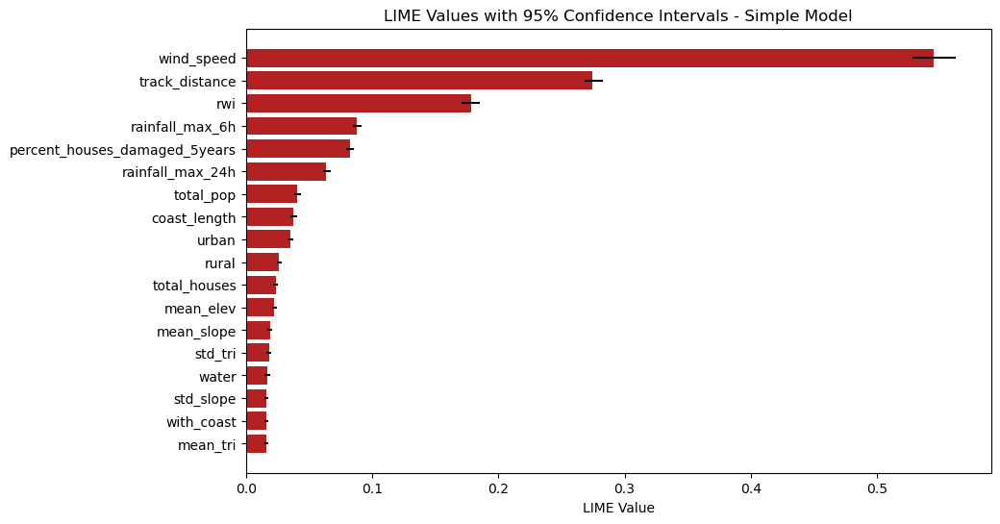

In [18]:
# plot
plt.figure(figsize=(10, 6))
plt.title("LIME Values with 95% Confidence Intervals - Simple Model")
plt.barh(bs_simlime.index, bs_simlime[0], xerr=[bs_simlime[0] - bs_simlime["CI_lower"], bs_simlime["CI_upper"] - bs_simlime[0]], color = "firebrick")
plt.gca().invert_yaxis()
plt.xlabel("LIME Value")

(array([ 1.,  1.,  1.,  3.,  0.,  3.,  2.,  2.,  5.,  5.,  7.,  4.,  5.,
         6., 10.,  5.,  4.,  2.,  6.,  7.,  3.,  3.,  2.,  3.,  2.,  3.,
         0.,  1.,  0.,  4.]),
 array([0.26638159, 0.26694086, 0.26750012, 0.26805938, 0.26861865,
        0.26917791, 0.26973718, 0.27029644, 0.27085571, 0.27141497,
        0.27197424, 0.2725335 , 0.27309277, 0.27365203, 0.2742113 ,
        0.27477056, 0.27532982, 0.27588909, 0.27644835, 0.27700762,
        0.27756688, 0.27812615, 0.27868541, 0.27924468, 0.27980394,
        0.28036321, 0.28092247, 0.28148174, 0.282041  , 0.28260027,
        0.28315953]),
 <BarContainer object of 30 artists>)

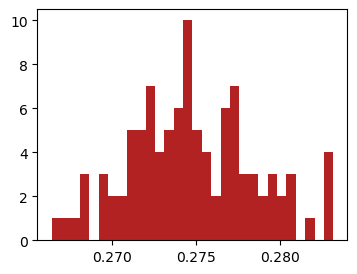

In [15]:
# plot distribution of LIME wind_speed values in histogram
plt.figure(figsize=(4, 3))
plt.hist(df_variability2.loc["track_distance"], bins=30, color = "firebrick")

### more bootstrapping samples

In [6]:
n = 200
ssize = 250
df_variability = pd.DataFrame()
for i in range(n):
    if i % 50 == 0:
        print("Iteration", i)
        
    # random sample of test set
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]
    lime_df = LIME_global(X_train, random_sample, features, xgb_model, seed=10*i)
    
    lime_avg = lime_df.abs().mean()
    df_variability = pd.concat([df_variability, lime_avg], axis=1)

# sort rows in df_variability by mean value of each row + sd
order = df_variability.mean(axis=1).sort_values(ascending=False)
df_variability2 = df_variability.loc[order.index]
df_variability2

# 40min

Iteration 0
Intercept 0.4499049262499039
Prediction_local [0.30080647]
Right: 0.1354851
Intercept 0.4663594132955358
Prediction_local [0.81985026]
Right: 1.1420705
Intercept 0.45193345792701184
Prediction_local [0.77595523]
Right: 0.27530512
Intercept 0.41115418137160764
Prediction_local [0.68565305]
Right: 0.90753275
Intercept 0.4216397781276357
Prediction_local [-0.56868153]
Right: -0.061884325
Intercept 0.4090894738803373
Prediction_local [0.45006405]
Right: 0.23771603
Intercept 0.43493525125609056
Prediction_local [-0.30348247]
Right: -0.0612548
Intercept 0.4671067205306796
Prediction_local [-0.31651642]
Right: -0.053582974
Intercept 0.4405937811160525
Prediction_local [0.48349935]
Right: -0.026613396
Intercept 0.4507871073484809
Prediction_local [0.1179126]
Right: -0.023452729
Intercept 0.44903991480694894
Prediction_local [1.56757803]
Right: 0.63401425
Intercept 0.4315461595585336
Prediction_local [-0.55118035]
Right: -0.05530562
Intercept 0.3825671253005711
Prediction_local [0.0

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wind_speed,0.546672,0.550688,0.540613,0.531514,0.532065,0.551492,0.555503,0.549293,0.538380,0.540124,...,0.544839,0.551039,0.540771,0.547493,0.552590,0.550097,0.542152,0.556560,0.538393,0.543596
track_distance,0.274285,0.277441,0.273209,0.274287,0.266382,0.275205,0.282909,0.273067,0.273686,0.279169,...,0.276634,0.276725,0.275010,0.277792,0.279007,0.281085,0.274541,0.278894,0.268961,0.275770
rwi,0.177082,0.173881,0.179730,0.181221,0.171327,0.178498,0.179458,0.180519,0.182084,0.176802,...,0.182363,0.180386,0.177069,0.182928,0.180766,0.182610,0.181477,0.181074,0.173788,0.183516
rainfall_max_6h,0.089394,0.088308,0.088123,0.088490,0.082339,0.088191,0.091502,0.088243,0.087264,0.086982,...,0.086764,0.087792,0.086750,0.088345,0.088565,0.088449,0.084813,0.090916,0.085279,0.086065
percent_houses_damaged_5years,0.080171,0.082186,0.081637,0.079639,0.079837,0.084465,0.084030,0.082822,0.083675,0.083069,...,0.083841,0.081996,0.080725,0.083551,0.083563,0.082013,0.081148,0.080703,0.079588,0.083246
rainfall_max_24h,0.064658,0.060765,0.063211,0.062317,0.060789,0.065494,0.066487,0.062623,0.064192,0.064040,...,0.066329,0.064397,0.062902,0.061059,0.064036,0.063350,0.062678,0.063149,0.063194,0.060476
total_pop,0.042516,0.041646,0.039932,0.040946,0.041687,0.040366,0.041725,0.040255,0.037903,0.040831,...,0.042324,0.041171,0.039353,0.042575,0.042592,0.041678,0.039372,0.042239,0.040220,0.040945
coast_length,0.035887,0.036087,0.037802,0.038854,0.035641,0.038172,0.039815,0.037147,0.037642,0.038405,...,0.037785,0.041182,0.035687,0.036760,0.039014,0.036151,0.040309,0.038470,0.038307,0.038494
urban,0.035543,0.036531,0.035948,0.034746,0.033642,0.035083,0.034865,0.034941,0.035910,0.035442,...,0.033286,0.033515,0.035395,0.035151,0.037979,0.034291,0.036058,0.036048,0.035562,0.034770
rural,0.028562,0.024751,0.026557,0.025238,0.024159,0.025719,0.027127,0.026613,0.026910,0.027483,...,0.023659,0.025444,0.028459,0.026163,0.027211,0.027055,0.027458,0.027465,0.026546,0.024876


In [7]:
bs_simlime2 = pd.DataFrame(df_variability2.mean(axis=1)).sort_values(by=0, ascending=False)
bs_simlime2["CI_lower"] = df_variability2.quantile(0.025, axis=1)
bs_simlime2["CI_upper"] = df_variability2.quantile(0.975, axis=1)
bs_simlime2

,0,CI_lower,CI_upper
wind_speed,0.545102,0.530532,0.560901
track_distance,0.274704,0.268004,0.281898
rwi,0.178721,0.171319,0.185504
rainfall_max_6h,0.087460,0.084654,0.091007
percent_houses_damaged_5years,0.082079,0.079265,0.085231
rainfall_max_24h,0.063599,0.060475,0.066806
total_pop,0.040737,0.038115,0.043404
coast_length,0.037784,0.035260,0.040629
urban,0.035480,0.032977,0.037985
rural,0.026272,0.024266,0.028462


Text(0.5, 0, 'LIME Value')

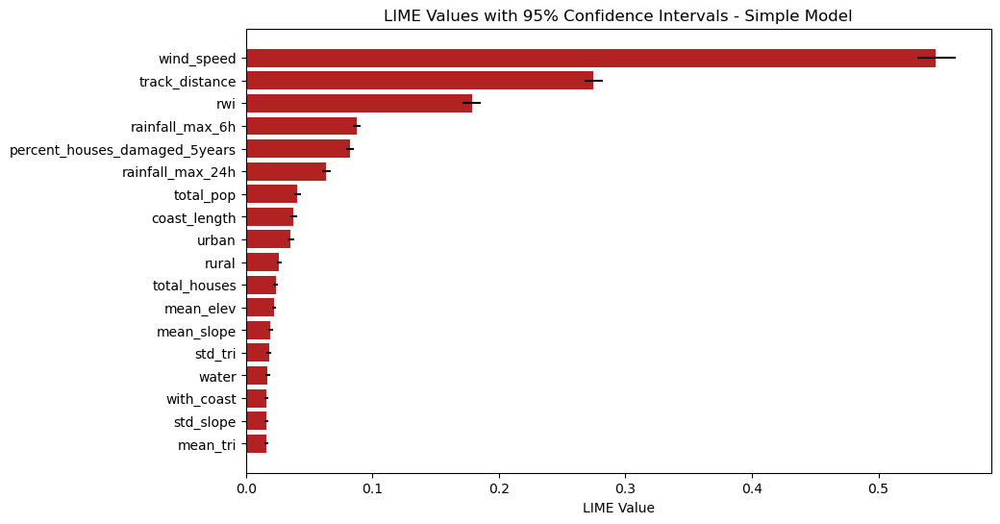

In [8]:
plt.figure(figsize=(10, 6))
plt.title("LIME Values with 95% Confidence Intervals - Simple Model")
plt.barh(bs_simlime2.index, 
         bs_simlime2[0], 
         xerr=[bs_simlime2[0] - bs_simlime2["CI_lower"], 
               bs_simlime2["CI_upper"] - bs_simlime2[0]], 
         color = "firebrick")
plt.gca().invert_yaxis()
plt.xlabel("LIME Value")

(array([ 2.,  2.,  1.,  3.,  3.,  3.,  6.,  4.,  6.,  8., 12.,  9.,  9.,
        12., 21., 14., 14.,  8., 10., 16.,  7.,  6.,  7.,  2.,  6.,  2.,
         1.,  1.,  1.,  4.]),
 array([0.26579292, 0.26638459, 0.26697626, 0.26756793, 0.26815959,
        0.26875126, 0.26934293, 0.2699346 , 0.27052626, 0.27111793,
        0.2717096 , 0.27230127, 0.27289293, 0.2734846 , 0.27407627,
        0.27466794, 0.2752596 , 0.27585127, 0.27644294, 0.27703461,
        0.27762627, 0.27821794, 0.27880961, 0.27940128, 0.27999294,
        0.28058461, 0.28117628, 0.28176795, 0.28235961, 0.28295128,
        0.28354295]),
 <BarContainer object of 30 artists>)

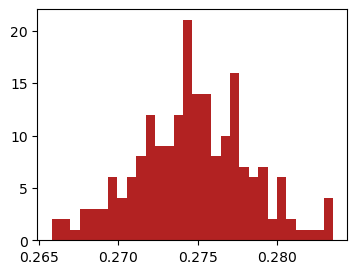

In [9]:
plt.figure(figsize=(4, 3))
plt.hist(df_variability2.loc["track_distance"], bins=30, color = "firebrick")

## LIME 2-Stage Model

In [10]:
n = 200
ssize = 250

df_variability = pd.DataFrame()

for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]
    lime_df = LIME_global(X_train, random_sample, features, xgb2sg, seed=10*i)

    lime_avg = lime_df.abs().mean()
    df_variability = pd.concat([df_variability, lime_avg], axis=1)

order = df_variability.mean(axis=1).sort_values(ascending=False)
var_lime2st = df_variability.loc[order.index]

#46min

Intercept 0.4981244432424264
Prediction_local [0.29553329]
Right: 0.1354851
Intercept 0.5324417480501652
Prediction_local [0.8949115]
Right: 1.1420705
Intercept 0.5072409470551767
Prediction_local [0.86275895]
Right: 0.27530512
Intercept 0.4544535533012907
Prediction_local [0.72358993]
Right: 0.90753275
Intercept 0.47030591377020403
Prediction_local [-0.59967488]
Right: 0.0
Intercept 0.4638364501541406
Prediction_local [0.43704652]
Right: 0.23771603
Intercept 0.503382296455345
Prediction_local [-0.32789682]
Right: 0.0
Intercept 0.5172273125166322
Prediction_local [-0.31257288]
Right: 0.0
Intercept 0.48352856025472307
Prediction_local [0.51294144]
Right: 0.0
Intercept 0.5243809520277283
Prediction_local [0.08706135]
Right: 0.0
Intercept 0.5104703170345268
Prediction_local [1.77150776]
Right: 0.63401425
Intercept 0.49454249591273375
Prediction_local [-0.59129527]
Right: 0.0
Intercept 0.43217419997603823
Prediction_local [0.04934559]
Right: 0.5494497
Intercept 0.5382026848710414
Predictio

In [11]:
bs_twostlime = pd.DataFrame(var_lime2st.mean(axis=1)).sort_values(by=0, ascending=False)
bs_twostlime["CI_lower"] = var_lime2st.quantile(0.025, axis=1)
bs_twostlime["CI_upper"] = var_lime2st.quantile(0.975, axis=1)
bs_twostlime

,0,CI_lower,CI_upper
wind_speed,0.646038,0.627741,0.666170
track_distance,0.288262,0.280429,0.296464
rwi,0.178336,0.171163,0.185650
percent_houses_damaged_5years,0.095233,0.091891,0.099218
rainfall_max_6h,0.090189,0.086619,0.094466
rainfall_max_24h,0.064475,0.060999,0.068199
total_pop,0.041184,0.037961,0.044348
coast_length,0.040690,0.037547,0.044235
urban,0.040000,0.036726,0.042878
rural,0.034257,0.031806,0.036910


Text(0.5, 0, 'LIME Value')

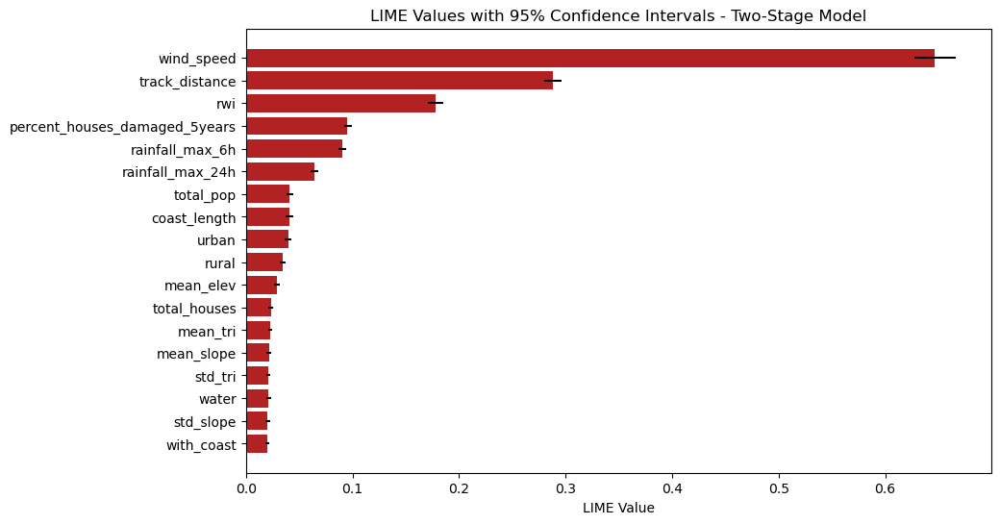

In [12]:
# plot
plt.figure(figsize=(10, 6))
plt.title("LIME Values with 95% Confidence Intervals - Two-Stage Model")
plt.barh(bs_twostlime.index, bs_twostlime[0], 
         xerr=[bs_twostlime[0] - bs_twostlime["CI_lower"], 
               bs_twostlime["CI_upper"] - bs_twostlime[0]], 
         color = "firebrick")
plt.gca().invert_yaxis()
plt.xlabel("LIME Value")


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
 [Text(0, 0, 'wind_speed'),
  Text(0, 1, 'track_distance'),
  Text(0, 2, 'rwi'),
  Text(0, 3, 'houses_dam_5y'),
  Text(0, 4, 'rainfall_max_6h'),
  Text(0, 5, 'rainfall_max_24h'),
  Text(0, 6, 'total_pop'),
  Text(0, 7, 'coast_length'),
  Text(0, 8, 'urban'),
  Text(0, 9, 'rural'),
  Text(0, 10, 'mean_elev'),
  Text(0, 11, 'total_houses'),
  Text(0, 12, 'mean_tri'),
  Text(0, 13, 'mean_slope'),
  Text(0, 14, 'std_tri'),
  Text(0, 15, 'water'),
  Text(0, 16, 'std_slope'),
  Text(0, 17, 'with_coast')])

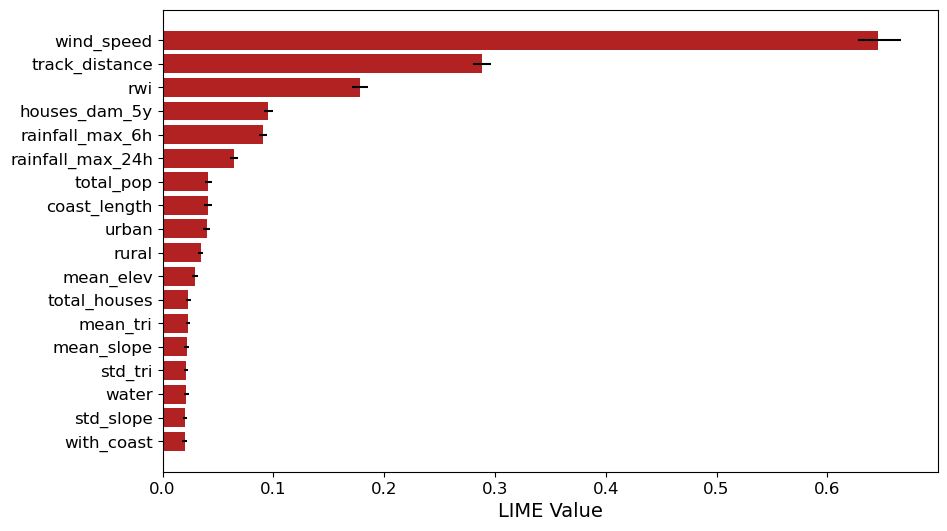

In [9]:
# graph
import pandas as pd
import matplotlib.pyplot as plt

bs_twostlime = {
    'wind_speed': [0.646038, 0.627741, 0.666170],
    'track_distance': [0.288262, 0.280429, 0.296464],
    'rwi': [0.178336, 0.171163, 0.185650],
    'houses_dam_5y': [0.095233, 0.091891, 0.099218],
    'rainfall_max_6h': [0.090189, 0.086619, 0.094466],
    'rainfall_max_24h': [0.064475, 0.060999, 0.068199],
    'total_pop': [0.041184, 0.037961, 0.044348],
    'coast_length': [0.040690, 0.037547, 0.044235],
    'urban': [0.040000, 0.036726, 0.042878],
    'rural': [0.034257, 0.031806, 0.036910],
    'mean_elev': [0.029141, 0.026380, 0.031861],
    'total_houses': [0.023360, 0.021433, 0.025658],
    'mean_tri': [0.022612, 0.020729, 0.025063],
    'mean_slope': [0.021731, 0.019603, 0.024062],
    'std_tri': [0.021195, 0.019138, 0.023079],
    'water': [0.021042, 0.019186, 0.023634],
    'std_slope': [0.020181, 0.018422, 0.022441],
    'with_coast': [0.019929, 0.017857, 0.021950]
}

bs_twostlime = pd.DataFrame(bs_twostlime, index=['Value', 'CI_lower', 'CI_upper'])
bs_twostlime = bs_twostlime.T.sort_values(by='Value', ascending=False)

plt.figure(figsize=(10, 6))
#plt.title("LIME Values with 95% Confidence Intervals - Two-Stage Model")
plt.barh(bs_twostlime.index, bs_twostlime["Value"], 
         xerr=[bs_twostlime["Value"] - bs_twostlime["CI_lower"], 
               bs_twostlime["CI_upper"] - bs_twostlime["Value"]], 
         color = "firebrick",
         )
plt.gca().invert_yaxis()
plt.xlabel("LIME Value", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

(array([ 3.,  2.,  2.,  6.,  7.,  9., 12., 18., 21., 19., 25., 19., 22.,
        15.,  7.,  4.,  4.,  2.,  2.,  1.]),
 array([0.1683845 , 0.16940096, 0.17041741, 0.17143387, 0.17245032,
        0.17346678, 0.17448323, 0.17549969, 0.17651615, 0.1775326 ,
        0.17854906, 0.17956551, 0.18058197, 0.18159842, 0.18261488,
        0.18363134, 0.18464779, 0.18566425, 0.1866807 , 0.18769716,
        0.18871361]),
 <BarContainer object of 20 artists>)

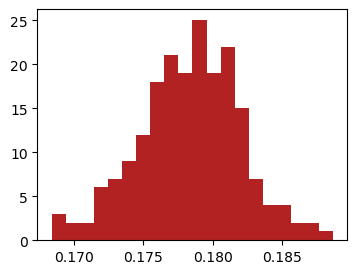

In [15]:
plt.figure(figsize=(4, 3))
plt.hist(var_lime2st.loc["rwi"], bins=20, color = "firebrick")

## SHAP Simple Model

In [6]:
n = 200
ssize = 250

df_variability = pd.DataFrame()
for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]

    explainer = shap.Explainer(xgb_model, X_train_df, seed=i*10)
    shap_values = explainer(random_sample)
    
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_avg = shap_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)


order = df_variability.mean(axis=1).sort_values(ascending=False)
var_shap = df_variability.loc[order.index]

bs_shap = pd.DataFrame(var_shap.mean(axis=1)).sort_values(by=0, ascending=False)
bs_shap["CI_lower"] = var_shap.quantile(0.025, axis=1)
bs_shap["CI_upper"] = var_shap.quantile(0.975, axis=1)
bs_shap

#43s

,0,CI_lower,CI_upper
wind_speed,1.132706,0.828805,1.528209
track_distance,0.191525,0.156258,0.247146
rainfall_max_6h,0.153060,0.122786,0.200293
percent_houses_damaged_5years,0.146468,0.123158,0.177896
rainfall_max_24h,0.125667,0.099318,0.169925
coast_length,0.044055,0.037813,0.052329
mean_elev,0.035967,0.028262,0.045214
urban,0.031836,0.025473,0.041517
mean_slope,0.029857,0.021630,0.040301
total_houses,0.028274,0.022390,0.041423


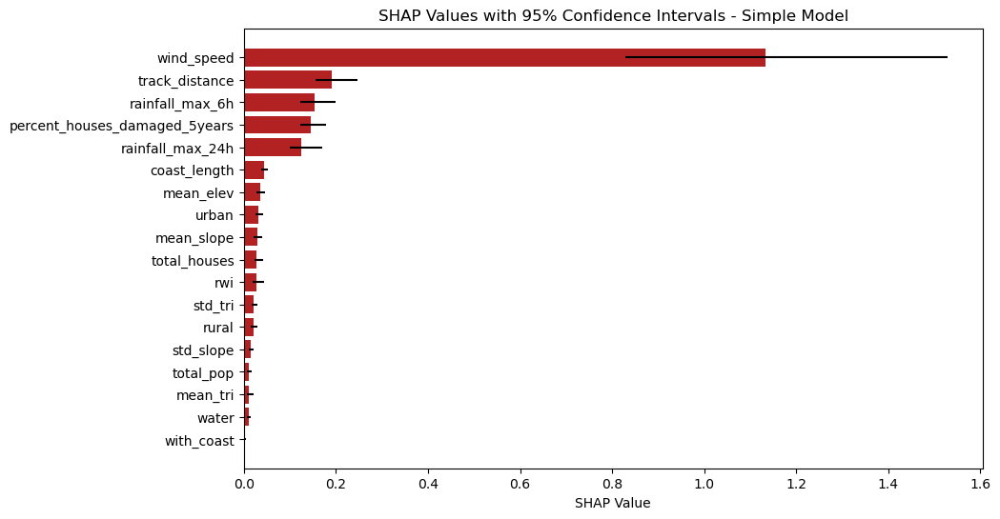

In [7]:
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(bs_shap.index, bs_shap[0], 
         xerr=[bs_shap[0] - bs_shap["CI_lower"], 
               bs_shap["CI_upper"] - bs_shap[0]], 
         color = "firebrick")
plt.title("SHAP Values with 95% Confidence Intervals - Simple Model")
plt.xlabel("SHAP Value")
plt.gca().invert_yaxis()


### more SHAP bootstrapping

In [25]:
# n = 200
# ssize = 250

# df_variability = pd.DataFrame()
# for i in range(n):
#     np.random.seed(i)
#     random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]
#     np.random.seed(i)
#     y_pred_sample = xgb_model.predict(random_sample)
#     y_pred_sample = y_pred_sample[:, np.newaxis]
#     explainer = shap.Explainer(xgb_model, X_train_df, seed=i*10)
#     shap_values = explainer(random_sample)
#     # standardize shap values with target variable
#     shap_values = shap_values.values / y_pred_sample

#     shap_df = pd.DataFrame(shap_values, columns=features)
#     shap_avg = shap_df.abs().mean()
#     df_variability = pd.concat([df_variability, shap_avg], axis=1)


# order = df_variability.mean(axis=1).sort_values(ascending=False)
# var_shap = df_variability.loc[order.index]

n = 200
ssize = 250

df_variability = pd.DataFrame()
for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]

    explainer = shap.Explainer(xgb_model, X_train_df, seed=i*10)
    shap_values = explainer(random_sample)

    # replace each shap value with ordered feature importance
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    rank_df = shap_df.abs()
    rank_df = rank_df.rank(method="min", axis=1).astype(int)

    shap_avg = rank_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)


order = df_variability.mean(axis=1).sort_values(ascending=False)
var_shap = df_variability.loc[order.index]

bs_shap = pd.DataFrame(var_shap.mean(axis=1)).sort_values(by=0, ascending=False)
bs_shap["CI_lower"] = var_shap.quantile(0.025, axis=1)
bs_shap["CI_upper"] = var_shap.quantile(0.975, axis=1)
bs_shap

,0,CI_lower,CI_upper
wind_speed,17.92318,17.8119,17.9840
track_distance,15.44764,15.1878,15.6680
rainfall_max_6h,15.26024,14.9715,15.5129
percent_houses_damaged_5years,14.76162,14.5717,14.9361
rainfall_max_24h,13.70470,13.2760,14.0961
coast_length,10.75930,10.3759,11.1364
total_houses,10.10250,9.7680,10.4004
urban,9.81734,9.4591,10.1683
mean_elev,9.65314,9.2759,10.0721
rwi,8.76378,8.4559,9.1163


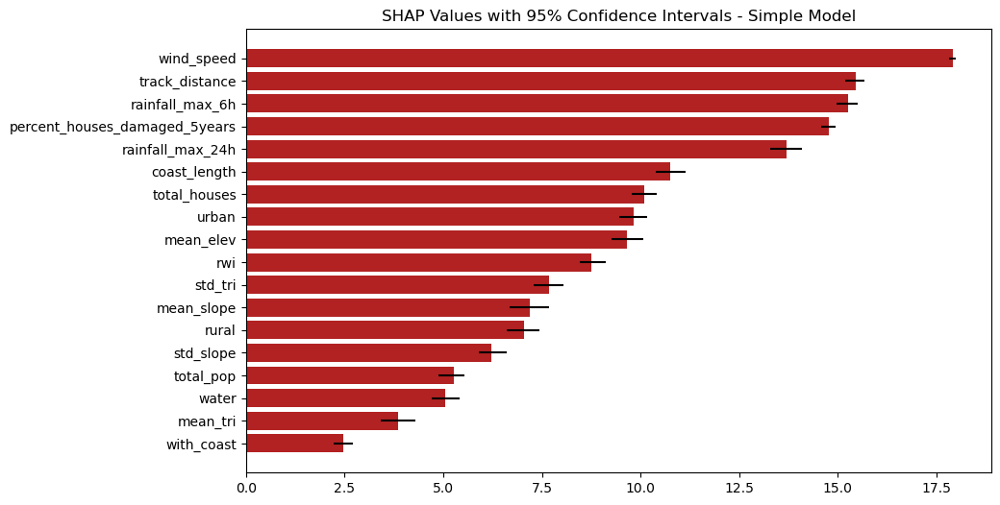

In [27]:
# plot
plt.figure(figsize=(10, 6))
plt.title("SHAP Values with 95% Confidence Intervals - Simple Model")
plt.barh(bs_shap.index, bs_shap[0], 
         xerr=[bs_shap[0] - bs_shap["CI_lower"], 
               bs_shap["CI_upper"] - bs_shap[0]], 
         color = "firebrick")
plt.gca().invert_yaxis()


In [18]:
n = 200
ssize = 1000 # adjusted bs size

df_variability = pd.DataFrame()
for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]

    explainer = shap.Explainer(xgb_model, X_train_df, seed=i*10)
    shap_values = explainer(random_sample)
    
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_avg = shap_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)


order = df_variability.mean(axis=1).sort_values(ascending=False)
var_shap = df_variability.loc[order.index]

bs_shap = pd.DataFrame(var_shap.mean(axis=1)).sort_values(by=0, ascending=False)
bs_shap["CI_lower"] = var_shap.quantile(0.025, axis=1)
bs_shap["CI_upper"] = var_shap.quantile(0.975, axis=1)
bs_shap

# 2.5 min

,0,CI_lower,CI_upper
wind_speed,1.134063,0.947483,1.324826
track_distance,0.192166,0.172806,0.219033
rainfall_max_6h,0.153069,0.137576,0.170846
percent_houses_damaged_5years,0.146338,0.132365,0.159173
rainfall_max_24h,0.126624,0.110189,0.144227
coast_length,0.044169,0.040173,0.048708
mean_elev,0.036062,0.031544,0.040131
urban,0.031854,0.028352,0.036724
mean_slope,0.029712,0.025687,0.034760
total_houses,0.028036,0.024569,0.032883


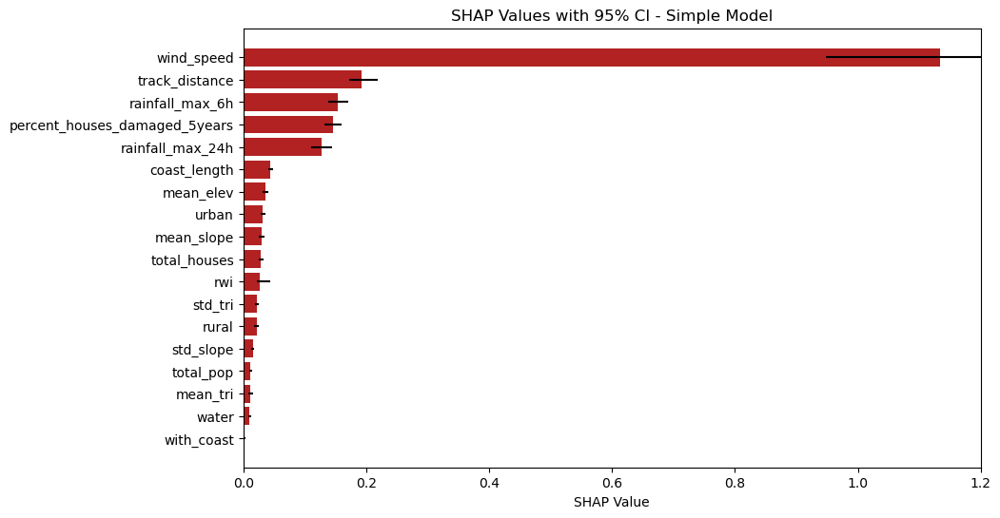

In [20]:
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(bs_shap.index, bs_shap[0], 
         xerr=[bs_shap[0] - bs_shap["CI_lower"], 
               bs_shap["CI_upper"] - bs_shap[0]], 
         color = "firebrick")
plt.title("SHAP Values with 95% CI - Simple Model")
plt.xlabel("SHAP Value")
plt.xlim(0, 1.2)
plt.gca().invert_yaxis()

In [22]:
# more boostrapping samples

n = 1000
ssize = 250

df_variability = pd.DataFrame()
for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]

    explainer = shap.Explainer(xgb_model, X_train_df, seed=i*10)
    shap_values = explainer(random_sample)
    
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_avg = shap_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)


order = df_variability.mean(axis=1).sort_values(ascending=False)
var_shap = df_variability.loc[order.index]

bs_shap = pd.DataFrame(var_shap.mean(axis=1)).sort_values(by=0, ascending=False)
bs_shap["CI_lower"] = var_shap.quantile(0.025, axis=1)
bs_shap["CI_upper"] = var_shap.quantile(0.975, axis=1)
bs_shap

#30s

,0,CI_lower,CI_upper
wind_speed,1.137908,0.783604,1.584710
track_distance,0.193027,0.153964,0.247794
rainfall_max_6h,0.152736,0.122786,0.198023
percent_houses_damaged_5years,0.146696,0.120913,0.180019
rainfall_max_24h,0.127059,0.097401,0.170412
coast_length,0.044129,0.036999,0.054859
mean_elev,0.036229,0.029055,0.045387
urban,0.031973,0.024721,0.042527
mean_slope,0.030161,0.022103,0.040942
total_houses,0.027995,0.021957,0.040090


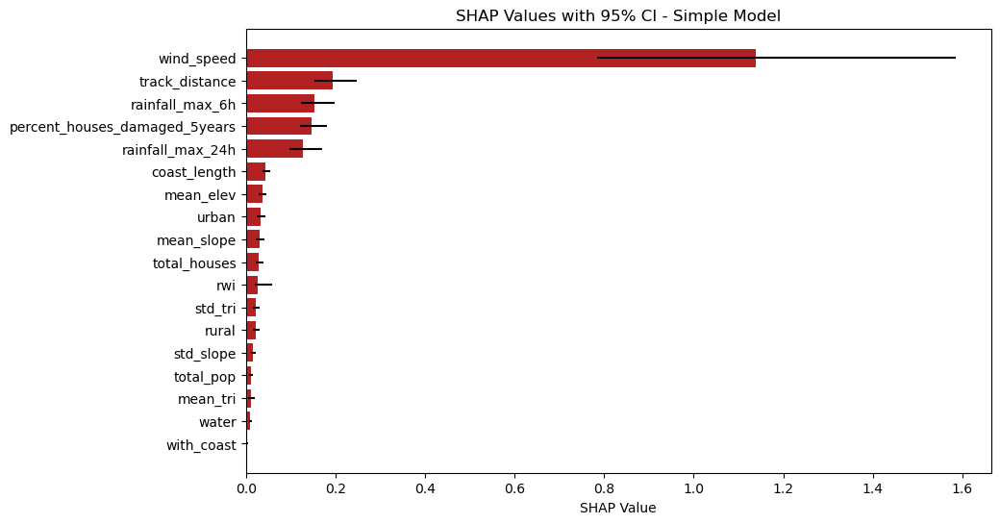

In [23]:
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(bs_shap.index, bs_shap[0], 
         xerr=[bs_shap[0] - bs_shap["CI_lower"], 
               bs_shap["CI_upper"] - bs_shap[0]], 
         color = "firebrick")
plt.title("SHAP Values with 95% CI - Simple Model")
plt.xlabel("SHAP Value")
plt.gca().invert_yaxis()


In [ ]:
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(bs_shap.index, bs_shap[0], 
         xerr=[bs_shap[0] - bs_shap["CI_lower"], 
               bs_shap["CI_upper"] - bs_shap[0]], 
         color = "firebrick")
plt.title("SHAP Values with 95% CI - Simple Model")
plt.xlim(0,1.3)
plt.xlabel("SHAP Value")
plt.gca().invert_yaxis()

(array([ 3.,  0.,  2., 16., 28., 36., 50., 68., 71., 81., 91., 98., 86.,
        77., 53., 47., 47., 29., 33., 18., 17., 13., 12.,  9.,  6.,  3.,
         1.,  3.,  1.,  1.]),
 array([0.13228787, 0.13733714, 0.14238641, 0.14743567, 0.15248494,
        0.1575342 , 0.16258347, 0.16763273, 0.172682  , 0.17773126,
        0.18278053, 0.1878298 , 0.19287906, 0.19792833, 0.20297759,
        0.20802686, 0.21307612, 0.21812539, 0.22317465, 0.22822392,
        0.23327319, 0.23832245, 0.24337172, 0.24842098, 0.25347025,
        0.25851951, 0.26356878, 0.26861805, 0.27366731, 0.27871658,
        0.28376584]),
 <BarContainer object of 30 artists>)

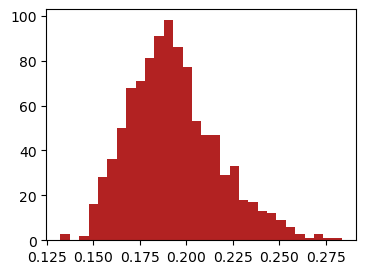

In [26]:
plt.figure(figsize=(4, 3))
plt.hist(df_variability.loc["track_distance"], bins=30, color = "firebrick")

## SHAP 2-Stage Model

In [8]:
n = 100
df_variability = pd.DataFrame()
for i in range(n):
    np.random.seed(i)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=True)]

    explainer = shap.Explainer(xgb2sg.predict, X_train_df, seed=i*10)
    shap_values = explainer(random_sample)

    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_avg = shap_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)

order = df_variability.mean(axis=1).sort_values(ascending=False)
var_shap2 = df_variability.loc[order.index]
var_shap2

PermutationExplainer explainer: 251it [01:18,  3.09it/s]                         
PermutationExplainer explainer: 251it [01:06,  3.20it/s]                         
PermutationExplainer explainer: 251it [01:01,  3.40it/s]                         
PermutationExplainer explainer: 251it [01:38,  2.13it/s]                         
PermutationExplainer explainer: 251it [02:15,  1.71it/s]                         
PermutationExplainer explainer: 251it [02:11,  1.76it/s]                         
PermutationExplainer explainer: 251it [02:10,  1.76it/s]                         
PermutationExplainer explainer: 251it [02:12,  1.74it/s]                         
PermutationExplainer explainer: 251it [02:10,  1.77it/s]                         
PermutationExplainer explainer: 251it [02:17,  1.69it/s]                         
PermutationExplainer explainer: 251it [02:10,  1.76it/s]                         
PermutationExplainer explainer: 251it [02:11,  1.76it/s]                         
PermutationExpla

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wind_speed,1.487780,1.693334,1.489260,1.488973,1.154126,1.574567,1.669953,1.184792,1.426083,1.320774,...,1.363456,1.591589,1.021939,1.275867,1.248066,1.235765,1.338307,1.357839,1.546794,1.367962
track_distance,0.278171,0.225065,0.215711,0.230720,0.209932,0.285212,0.264808,0.215248,0.218308,0.244241,...,0.225510,0.274056,0.229050,0.209771,0.228193,0.206792,0.203485,0.217348,0.234071,0.215668
rainfall_max_6h,0.262070,0.208831,0.189919,0.171783,0.143572,0.193628,0.273257,0.183763,0.163161,0.207762,...,0.198645,0.231062,0.207976,0.176195,0.173490,0.153875,0.195143,0.219997,0.209386,0.185181
percent_houses_damaged_5years,0.180715,0.178850,0.155999,0.157403,0.153493,0.191795,0.186826,0.152567,0.163959,0.159008,...,0.142864,0.195347,0.152458,0.172407,0.142431,0.146694,0.168158,0.163746,0.178352,0.160469
rainfall_max_24h,0.156858,0.171512,0.142591,0.146308,0.110431,0.173775,0.185934,0.114098,0.113198,0.146583,...,0.141365,0.175483,0.125359,0.113894,0.136513,0.120758,0.137385,0.152397,0.188918,0.162926
mean_elev,0.126485,0.119501,0.096785,0.095651,0.071945,0.096278,0.113629,0.087580,0.089808,0.113600,...,0.083478,0.111594,0.078172,0.097065,0.086608,0.068786,0.103643,0.107322,0.122045,0.100674
urban,0.101827,0.087915,0.061525,0.064803,0.047248,0.064642,0.107016,0.063243,0.062005,0.073003,...,0.064653,0.085275,0.070910,0.057265,0.077634,0.056924,0.068577,0.097456,0.076744,0.072475
mean_slope,0.065541,0.071184,0.065570,0.050977,0.048554,0.069244,0.068122,0.060007,0.054890,0.065099,...,0.063826,0.075997,0.045827,0.053438,0.066807,0.050391,0.064174,0.059678,0.083829,0.048393
coast_length,0.065255,0.054896,0.053427,0.056828,0.052844,0.060910,0.068140,0.048129,0.048205,0.075419,...,0.057712,0.068960,0.056323,0.050894,0.049458,0.043975,0.063822,0.062690,0.067275,0.052908
mean_tri,0.058614,0.046468,0.043991,0.036648,0.034153,0.053099,0.043063,0.040170,0.049523,0.051337,...,0.041379,0.072010,0.037715,0.037480,0.040024,0.038439,0.038090,0.047936,0.046224,0.041746


In [10]:
# ci
bs_shap2 = pd.DataFrame(var_shap2.mean(axis=1)).sort_values(by=0, ascending=False)
bs_shap2["CI_lower"] = var_shap2.quantile(0.025, axis=1)
bs_shap2["CI_upper"] = var_shap2.quantile(0.975, axis=1)
bs_shap2

,0,CI_lower,CI_upper
wind_speed,1.380196,1.006425,1.806551
track_distance,0.233880,0.196806,0.290139
rainfall_max_6h,0.202794,0.155004,0.270185
percent_houses_damaged_5years,0.166539,0.136621,0.204752
rainfall_max_24h,0.143976,0.107711,0.187501
mean_elev,0.097638,0.070286,0.125346
urban,0.070315,0.047499,0.100764
mean_slope,0.061235,0.047987,0.079650
coast_length,0.056976,0.045207,0.070871
mean_tri,0.045679,0.033581,0.065841


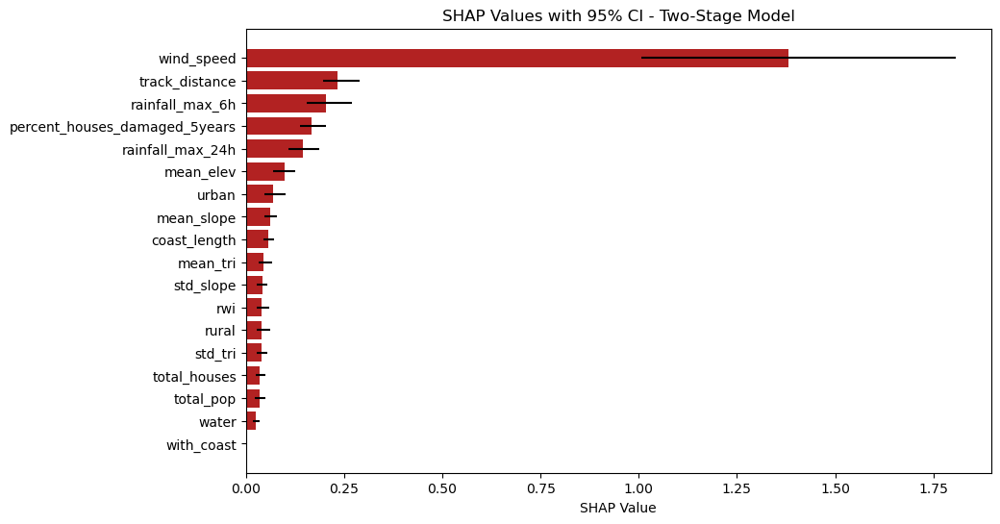

In [12]:
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(bs_shap2.index, bs_shap2[0], 
         xerr=[bs_shap2[0] - bs_shap2["CI_lower"], 
               bs_shap2["CI_upper"] - bs_shap2[0]], 
         color = "firebrick")
plt.title("SHAP Values with 95% CI - Two-Stage Model")
plt.xlabel("SHAP Value")
plt.gca().invert_yaxis()


In [8]:
n = 5
ssize = 250
df_variability = pd.DataFrame()
for i in range(n):
    # low = 100*(i)
    # high = 100*(i+1)

    explainer = shap.Explainer(xgb2sg.predict, X_train_df, seed=i*10)
    random_sample = X_test[np.random.choice(X_test.shape[0], ssize, replace=False)]
    # shap_values = explainer(X_test[low:high])
    shap_values = explainer(random_sample)
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_avg = shap_df.abs().mean()
    df_variability = pd.concat([df_variability, shap_avg], axis=1)

PermutationExplainer explainer: 251it [01:18,  2.97it/s]                         
PermutationExplainer explainer: 251it [01:13,  2.95it/s]                         
PermutationExplainer explainer: 251it [01:12,  2.98it/s]                         
PermutationExplainer explainer: 251it [01:14,  2.91it/s]                         
PermutationExplainer explainer: 251it [01:19,  2.79it/s]                         


In [11]:
bs_2stshap = pd.DataFrame(df_variability.mean(axis=1)).sort_values(by=0, ascending=False)
bs_2stshap["CI_lower"] = df_variability.quantile(0.025, axis=1)
bs_2stshap["CI_upper"] = df_variability.quantile(0.975, axis=1)
bs_2stshap

,0,CI_lower,CI_upper
wind_speed,1.221809,1.113208,1.403034
track_distance,0.233442,0.206202,0.279437
rainfall_max_6h,0.212083,0.184445,0.234413
percent_houses_damaged_5years,0.188129,0.171035,0.208602
rainfall_max_24h,0.140929,0.114326,0.166886
mean_elev,0.115970,0.099607,0.130805
urban,0.074028,0.059985,0.099849
coast_length,0.066110,0.057609,0.073021
total_pop,0.053481,0.048809,0.059127
rural,0.051793,0.044045,0.060940


<BarContainer object of 18 artists>

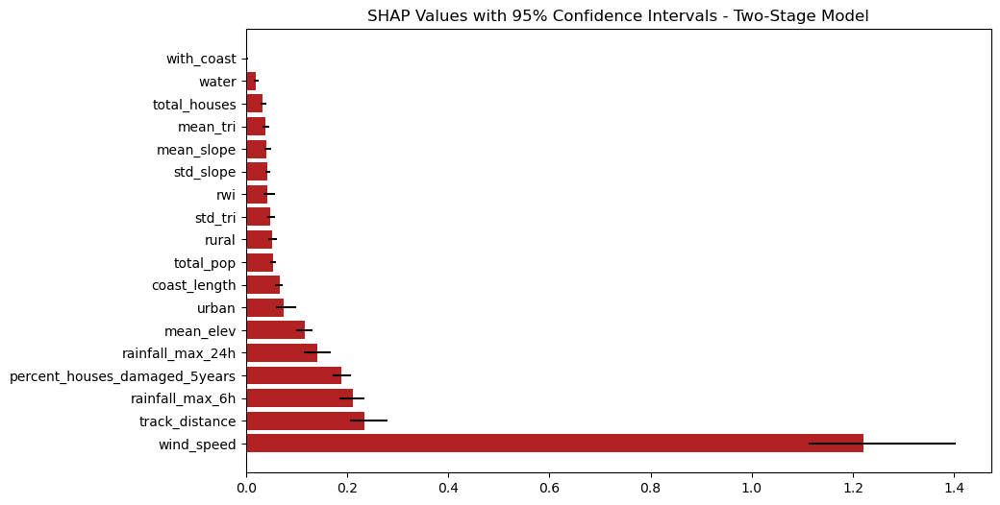

In [13]:
#plot bs
plt.figure(figsize=(10, 6))
plt.title("SHAP Values with 95% Confidence Intervals - Two-Stage Model")
plt.barh(bs_2stshap.index, bs_2stshap[0], xerr=[bs_2stshap[0] - bs_2stshap["CI_lower"], bs_2stshap["CI_upper"] - bs_2stshap[0]], color = "firebrick")
# plt.xlabel("SHAP Value")
# plt.ylabel("Feature")